In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')

from main import load_and_prepare_sessions
from analysis.performance_funcs import add_performance_container
from analysis.timepoint_analysis import aggregate_signals
from data.mouse import create_mice_dict
from plotting.main_plotting import main_plotting_function
from utils import count_session_events
from processing.session_sampling import MiceAnalysis


from collections import defaultdict
import matplotlib.pyplot as plt

sessions = load_and_prepare_sessions("../../Baseline", load_from_pickle=True, remove_bad_signal_sessions=True)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
mice_dict = create_mice_dict(sessions)

In [3]:
for mouse in mice_dict.values():
    add_performance_container(mouse)

    for session in mouse.sessions:
        session.metric_container = mouse.metric_container

In [4]:
session_metric_order = defaultdict(list)

for idx, session in enumerate(sessions):
    for metric, val in session.metric_container.data.items():
        session_metric_order[metric].append((idx, val))

metric_session_order = {}
for metric, pairs in session_metric_order.items():
    sorted_metrics = sorted(pairs, key=lambda t: t[-1])
    metric_session_order[metric] = list(zip(*sorted_metrics))[0]

In [5]:
mouse_analyser = MiceAnalysis(sessions)

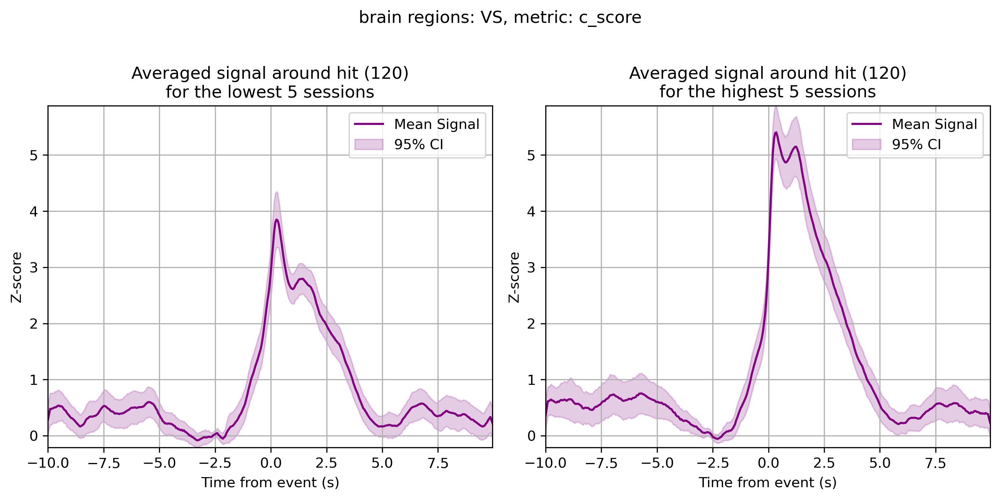

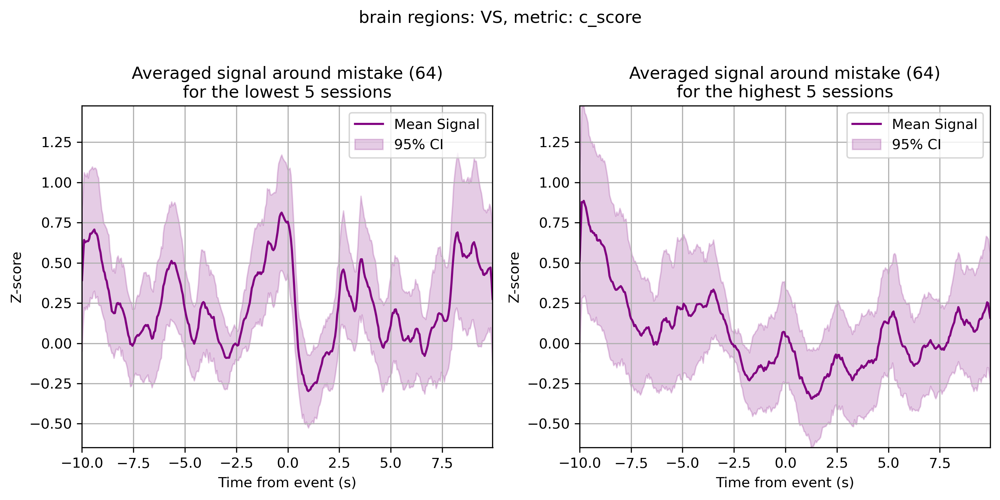

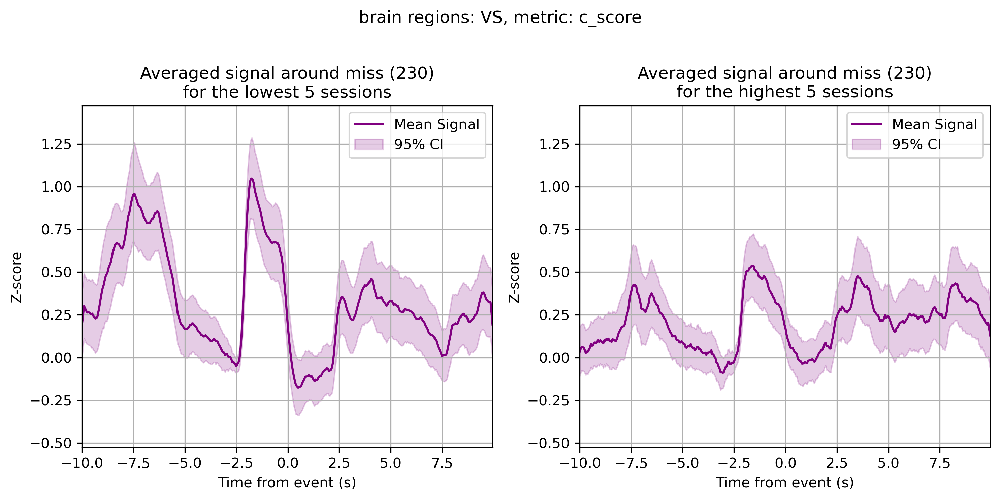

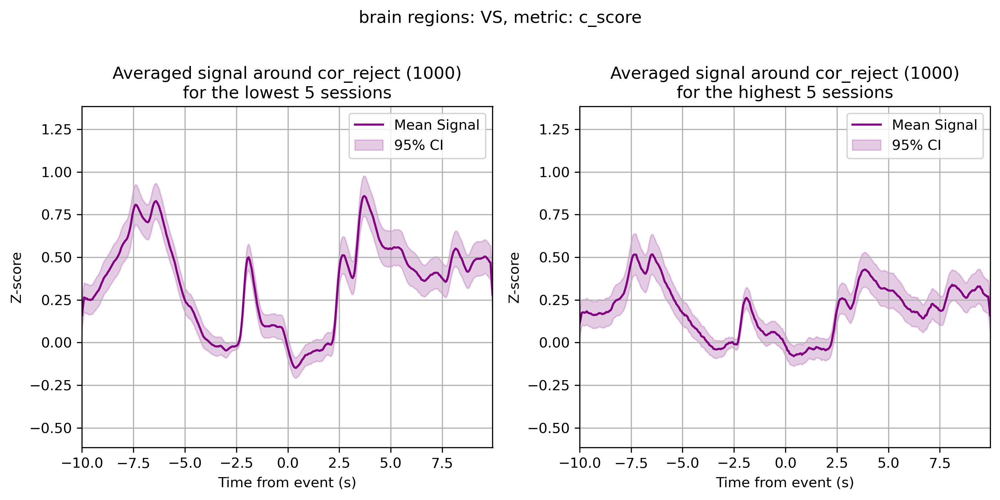

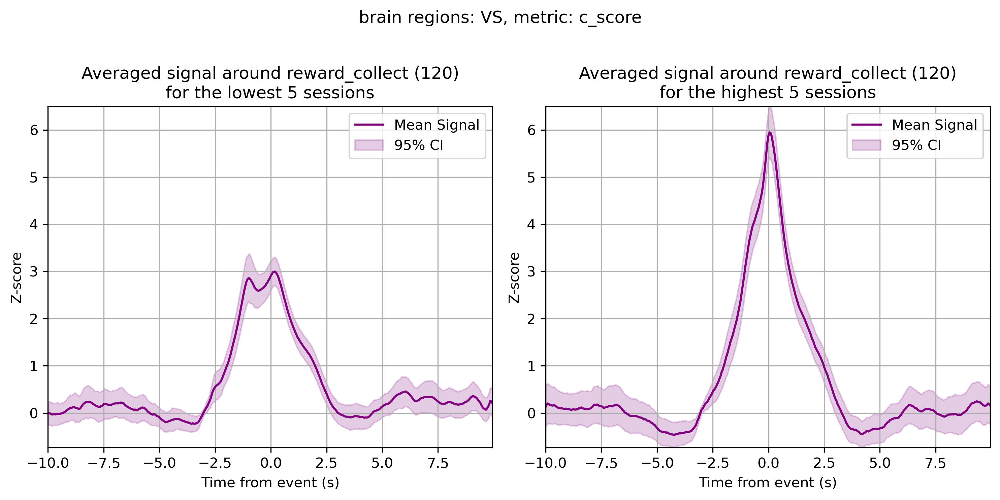

...

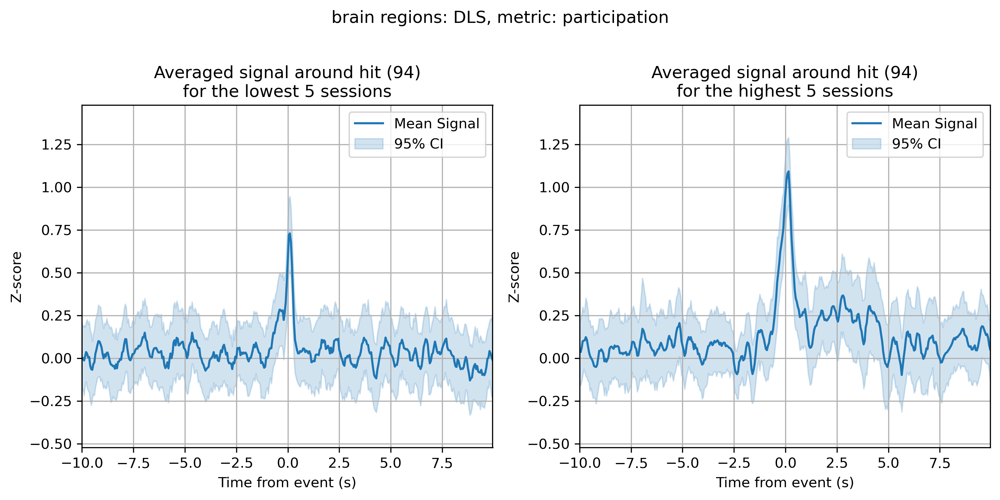

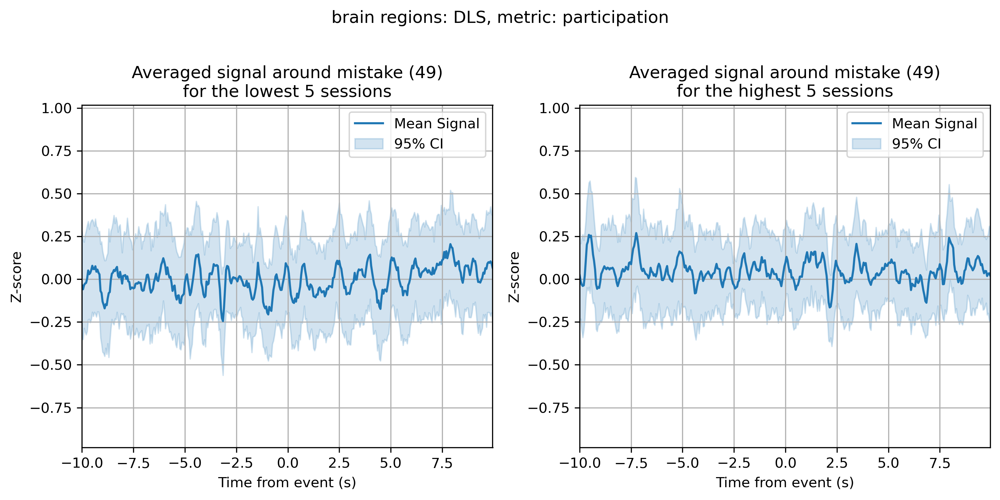

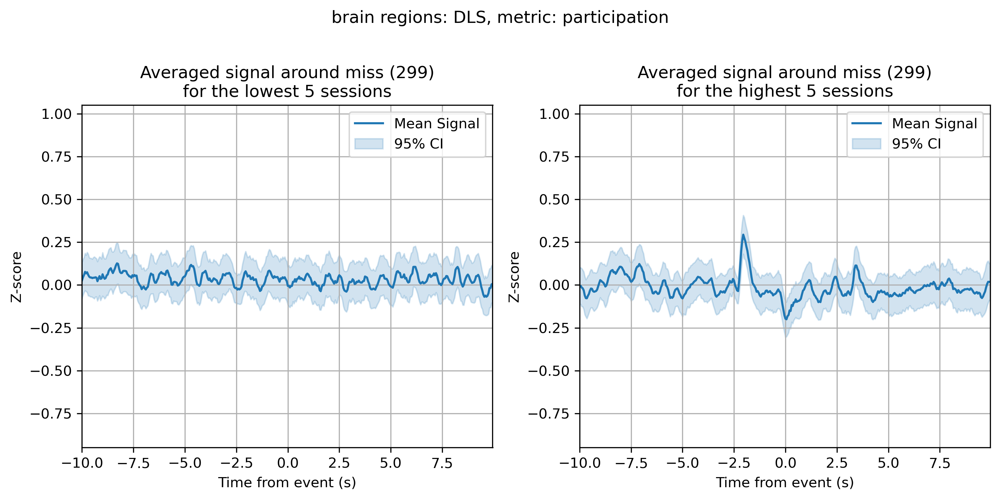

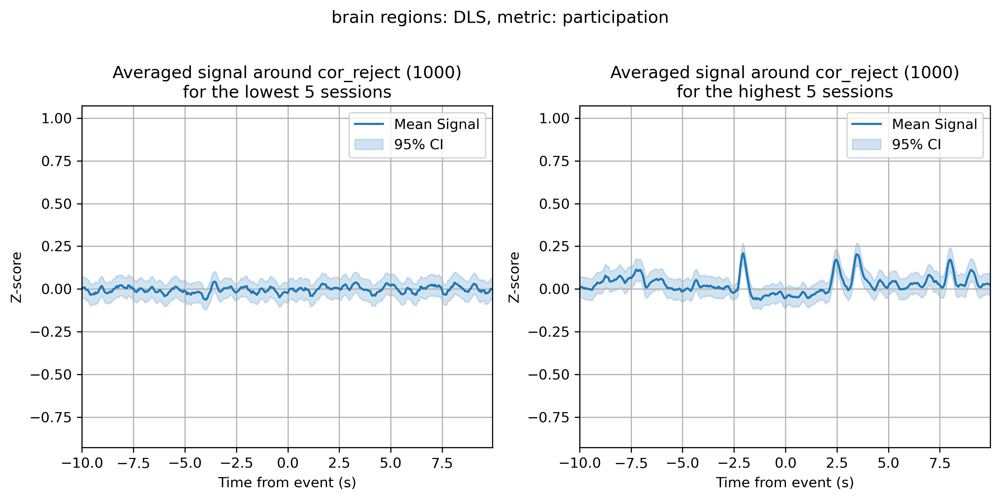

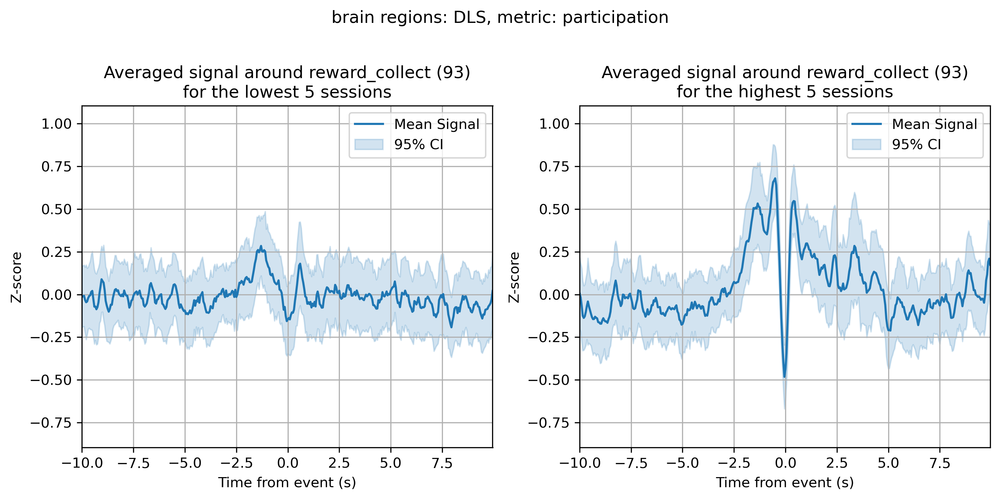

In [6]:
all_colors = ['purple', 'forestgreen', 'C0']

def is_relevant_session(brain_regions, event_type, idx):
    curr_session = sessions[idx]
    return ((brain_regions[0] in curr_session.brain_regions or brain_regions[1] in curr_session.brain_regions)
            and curr_session.event_idxs_container.get_data(event_type))

#TODO: add time_to_reward_collect, time_to_touch, total_ITI_touches
for metric, session_order in metric_session_order.items(): 
    if metric not in ('c_score', 'participation'):
        continue
    # for brain_regions, color in zip([['DMS_left', 'DMS_right']],
    #                                   all_colors):
    for brain_region, color in zip(['VS', 'DMS', 'DLS'],
                                     all_colors):
        for event_type in ['hit', 'mistake', 'miss', 'cor_reject', 'reward_collect']:            
            n = 1000
            low_out, high_out, _, _ = mouse_analyser.sample_phot_signals(metric, brain_region, event_type, n=n)

            low_subtitle = f"Averaged signal around {event_type} ({low_out[-1]})\nfor the lowest 5 sessions"
            high_subtitle = f"Averaged signal around {event_type} ({high_out[-1]})\nfor the highest 5 sessions"
            suptitle = f"brain regions: {brain_region}, metric: {metric}\n"

            main_plotting_function([low_out[:4], high_out[:4]], [low_subtitle, high_subtitle], suptitle, color)
